In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import missingno as mno

sns.set_theme()

In [3]:
air_quality = pd.read_csv('../data/processed/air-quality.csv')
weather = pd.read_csv('../data/processed/weather.csv')

Text(0.5, 1.0, 'Weather Correlation Matrix')

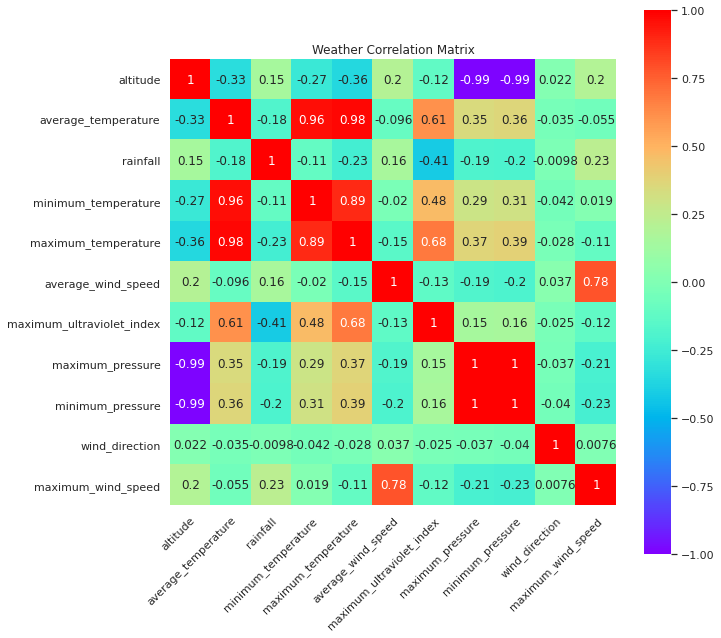

In [4]:
plt.figure(figsize=(10,10))

ax = sns.heatmap(weather.drop('station', axis=1).corr(), square=True, annot=True, vmin=-1, vmax=1, cmap='rainbow')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

plt.title("Weather Correlation Matrix")

Text(0.5, 1.0, 'Air Quality Correlation Matrix')

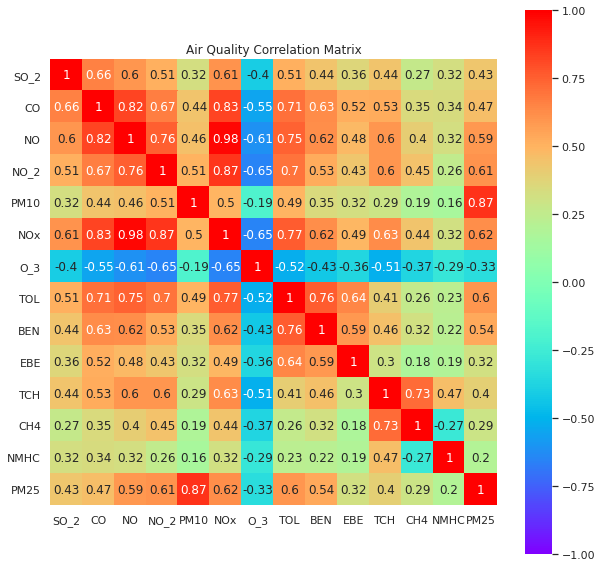

In [5]:
plt.figure(figsize=(10,10))
sns.heatmap(air_quality.drop('station', axis=1).corr(), square=True, annot=True, vmin=-1, vmax=1, cmap='rainbow')
plt.title("Air Quality Correlation Matrix")

In [6]:
air_quality_avg = air_quality[["date", "O_3", "NO_2", "PM25", "PM10", "SO_2"]].groupby('date').mean().reset_index()
weather_avg = weather.drop('altitude', axis=1).groupby('date').mean().reset_index()
air_quality_weather_avg = pd.merge(weather_avg, air_quality_avg, how='outer', on='date')
air_quality_weather_avg['date']= pd.to_datetime(air_quality_weather_avg['date'])

In [7]:
set(weather_avg['date']) - set(air_quality_avg['date'])

{'2003-07-05'}

On 2003-07-05 there was no data on any air quality station, the reason is unknown.

Text(0.5, 1.0, 'Air Quality & Weather (stations averaged) Correlation Matrix')

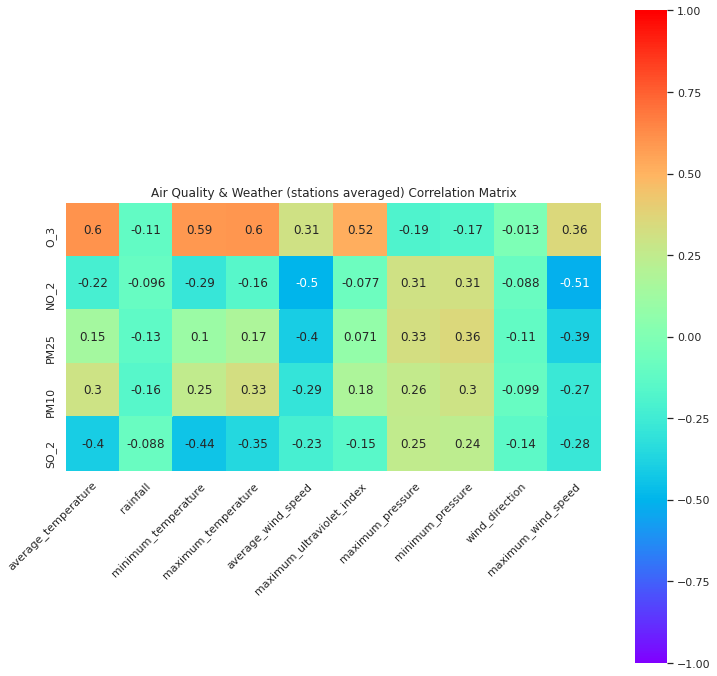

In [8]:
plt.figure(figsize=(12,12))
ax = sns.heatmap(air_quality_weather_avg.corr().drop(['average_temperature', 'rainfall',	'minimum_temperature', 'maximum_temperature', 'average_wind_speed', 'maximum_ultraviolet_index', 'maximum_pressure', 'minimum_pressure', 'wind_direction', 'maximum_wind_speed']).drop(['O_3', 'NO_2', 'PM25', 'PM10', 'SO_2'], axis=1), square=True, annot=True, vmin=-1, vmax=1, cmap='rainbow')
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
plt.title("Air Quality & Weather (stations averaged) Correlation Matrix")

In [9]:
fig = px.scatter(air_quality_weather_avg, x='date', y='O_3',
    trendline='lowess', trendline_color_override='red',
    color='maximum_temperature', width=1200, height=500, render_mode='svg',
    title='Ozone and max. temperatures (2001-2020)')
fig.update_traces(marker=dict(size=6), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'O_3 ug/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

In [10]:
fig = px.scatter(air_quality_weather_avg, x='date', y='NO_2',
    trendline='lowess', trendline_color_override='blue',
    color='maximum_wind_speed', color_continuous_scale='ice_r',
    width=1200, height=500, render_mode='svg',
    title='NO_2 and max. wind speed (2001-2020)')
fig.update_traces(marker=dict(size=6), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'NO_2 ug/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

In [11]:
fig = px.scatter(air_quality_weather_avg[(air_quality_weather_avg['date'] >= '2003-01-01')], x='date', y='PM25',
    trendline='lowess', trendline_color_override='blue',
    color='maximum_wind_speed', color_continuous_scale='ice_r',
    width=1200, height=500, render_mode='svg',
    title='PM<sub>2.5</sub> and max. wind speed (2003-2020)')
fig.update_traces(marker=dict(size=4), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'Particulate Matter < 2.5 µm per µg/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

In [12]:
fig = px.scatter(air_quality_weather_avg, x='date', y='PM10',
    trendline='lowess', trendline_color_override='red',
    color='maximum_temperature', width=1200, height=500, render_mode='svg',
    title='PM<sub>10</sub> and max. temperatures (2001-2020)')
fig.update_traces(marker=dict(size=6), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'Particulate Matter < 10 µm per µg/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

In [13]:
fig = px.scatter(air_quality_weather_avg, x='date', y='SO_2',
    trendline='lowess', trendline_color_override='red',
    color='minimum_temperature', width=1200, height=500, render_mode='svg',
    title='SO<sub>2</sub> and min. temperatures (2001-2020)')
fig.update_traces(marker=dict(size=6), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'SO<sub>2</sub>  µg/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

In [14]:
fig = px.scatter(air_quality_weather_avg, x='O_3', y='NO_2',
    trendline='lowess', trendline_color_override='red',
    color='maximum_temperature', width=1200, height=500, render_mode='svg',
    title='NO<sub>2</sub> and O<sub>3</sub> with max. temperatures (2001-2020)')
fig.update_traces(marker=dict(size=6), showlegend=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig['data'][0]['name'] = 'NO<sub>2</sub> and O<sub>3</sub> µg/m3'
fig['data'][1]['name'] = 'Trend (LOWESS)'
fig.show()

<AxesSubplot:>

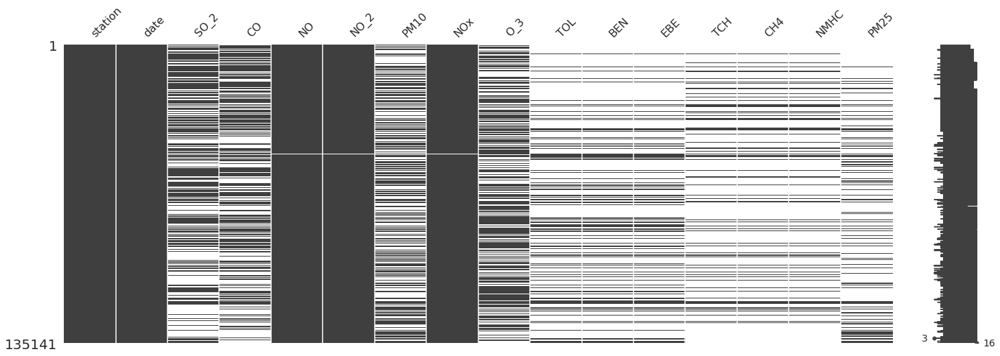

In [15]:
mno.matrix(air_quality, figsize = (24, 8))

<AxesSubplot:>

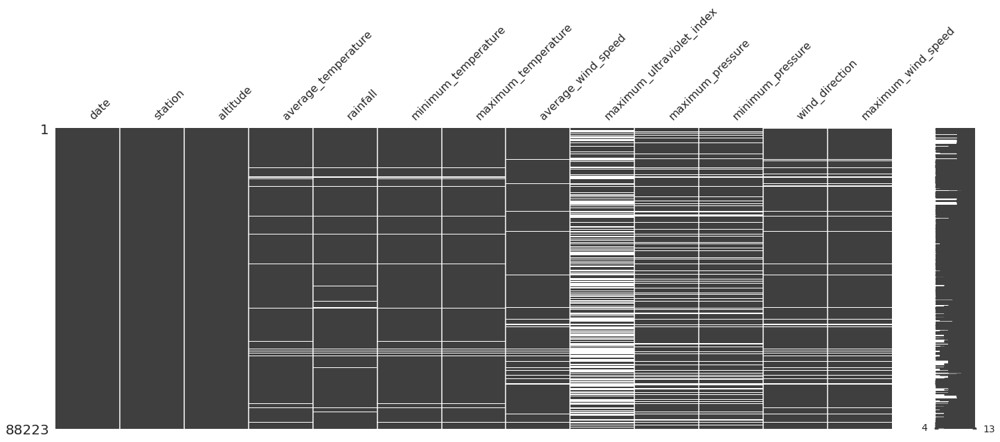

In [16]:
mno.matrix(weather, figsize = (24, 8))

For this next visualization we will use the 2017 European Air Quality Index (EAQI) as stated below

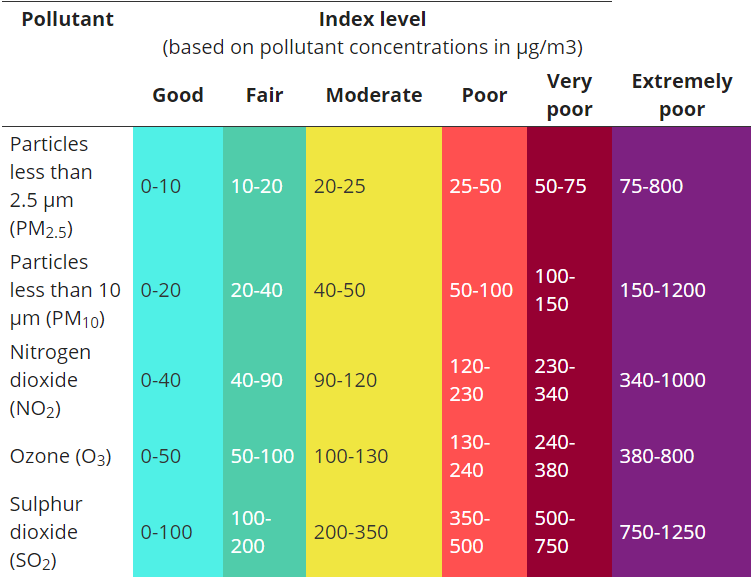

In [17]:
from IPython.display import Image
Image(filename='../references/european_air_quality_index.png')

In [18]:
air_quality_weather_avg.tail(2)

,date,average_temperature,rainfall,minimum_temperature,maximum_temperature,average_wind_speed,maximum_ultraviolet_index,maximum_pressure,minimum_pressure,wind_direction,maximum_wind_speed,O_3,NO_2,PM25,PM10,SO_2
7303,2020-12-30,2.300000,0.750000,-1.733333,6.341667,2.88,5.750000,910.92,904.82,30.7,12.49,52.153846,27.347826,3.833333,6.909091,2.777778
7304,2020-12-31,1.323077,2.892308,-3.007692,5.653846,3.42,3.266667,910.58,901.73,26.2,13.42,35.615385,31.217391,6.166667,9.909091,3.222222


In [19]:
def compute_PM25_aqi(row):
    if row['PM25'] <= 10:
        PM25_index = 'Good'
    elif row['PM25'] <= 20:
        PM25_index = 'Fair'
    elif row['PM25'] <= 25:
        PM25_index = 'Moderate'
    elif row['PM25'] <= 50:
        PM25_index = 'Poor'
    elif row['PM25'] <= 75:
        PM25_index = 'Very poor'
    elif row['PM25'] <= 800:
        PM25_index = 'Extremely poor'
    else:
        PM25_index = np.nan

    return PM25_index

air_quality_weather_avg['PM25_aqi'] = air_quality_weather_avg.apply(lambda row: compute_PM25_aqi(row), axis=1)

In [20]:
def compute_PM10_aqi(row):
    if row['PM10'] <= 20:
        PM10_index = 'Good'
    elif row['PM10'] <= 40:
        PM10_index = 'Fair'
    elif row['PM10'] <= 50:
        PM10_index = 'Moderate'
    elif row['PM10'] <= 100:
        PM10_index = 'Poor'
    elif row['PM10'] <= 150:
        PM10_index = 'Very poor'
    elif row['PM10'] <= 1200:
        PM10_index = 'Extremely poor'
    else:
        PM10_index = np.nan

    return PM10_index

air_quality_weather_avg['PM10_aqi'] = air_quality_weather_avg.apply(lambda row: compute_PM10_aqi(row), axis=1)

In [21]:
def compute_NO_2_aqi(row):
    if row['NO_2'] <= 40:
        NO_2_index = 'Good'
    elif row['NO_2'] <= 90:
        NO_2_index = 'Fair'
    elif row['NO_2'] <= 120:
        NO_2_index = 'Moderate'
    elif row['NO_2'] <= 230:
        NO_2_index = 'Poor'
    elif row['NO_2'] <= 340:
        NO_2_index = 'Very poor'
    elif row['NO_2'] <= 1000:
        NO_2_index = 'Extremely poor'
    else:
        NO_2_index = np.nan

    return NO_2_index

air_quality_weather_avg['NO_2_aqi'] = air_quality_weather_avg.apply(lambda row: compute_NO_2_aqi(row), axis=1)

In [22]:
def compute_O_3_aqi(row):
    if row['O_3'] <= 50:
        O_3_index = 'Good'
    elif row['O_3'] <= 100:
        O_3_index = 'Fair'
    elif row['O_3'] <= 130:
        O_3_index = 'Moderate'
    elif row['O_3'] <= 240:
        O_3_index = 'Poor'
    elif row['O_3'] <= 380:
        O_3_index = 'Very poor'
    elif row['O_3'] <= 800:
        O_3_index = 'Extremely poor'
    else:
        O_3_index = np.nan

    return O_3_index

air_quality_weather_avg['O_3_aqi'] = air_quality_weather_avg.apply(lambda row: compute_O_3_aqi(row), axis=1)

In [23]:
def compute_SO_2_aqi(row):
    if row['SO_2'] <= 100:
        SO_2_index = 'Good'
    elif row['SO_2'] <= 200:
        SO_2_index = 'Fair'
    elif row['SO_2'] <= 350:
        SO_2_index = 'Moderate'
    elif row['SO_2'] <= 500:
        SO_2_index = 'Poor'
    elif row['SO_2'] <= 750:
        SO_2_index = 'Very poor'
    elif row['SO_2'] <= 1250:
        SO_2_index = 'Extremely poor'
    else:
        SO_2_index = np.nan

    return SO_2_index

air_quality_weather_avg['SO_2_aqi'] = air_quality_weather_avg.apply(lambda row: compute_SO_2_aqi(row), axis=1)

In [24]:
def compare_aqi(element):
    conversion = {
        np.nan: -1,
        'Good': 0,
        'Fair': 1,
        'Moderate': 2,
        'Poor': 3,
        'Very poor': 4,
        'Extremely poor': 5
    }

    return conversion[element]
    
def compute_general_aqi(row):
    pollutants = [row['PM25_aqi'], row['PM10_aqi'], row['NO_2_aqi'], row['O_3_aqi'], row['SO_2_aqi']]
    return max(pollutants, key=compare_aqi)


air_quality_weather_avg['general_aqi'] = air_quality_weather_avg.apply(lambda row: compute_general_aqi(row), axis=1)

In [25]:
df = air_quality_weather_avg.set_index('date')
categories = {
        'Good': 0,
        'Fair': 1,
        'Moderate': 2,
        'Poor': 3,
        'Very poor': 4,
        'Extremely poor': 5
    }

df['general_aqi'] = df['general_aqi'].map(categories)

df['general_aqi'].index


DatetimeIndex(['2001-01-01', '2001-01-02', '2001-01-03', '2001-01-04',
               '2001-01-05', '2001-01-06', '2001-01-07', '2001-01-08',
               '2001-01-09', '2001-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', name='date', length=7305, freq=None)

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


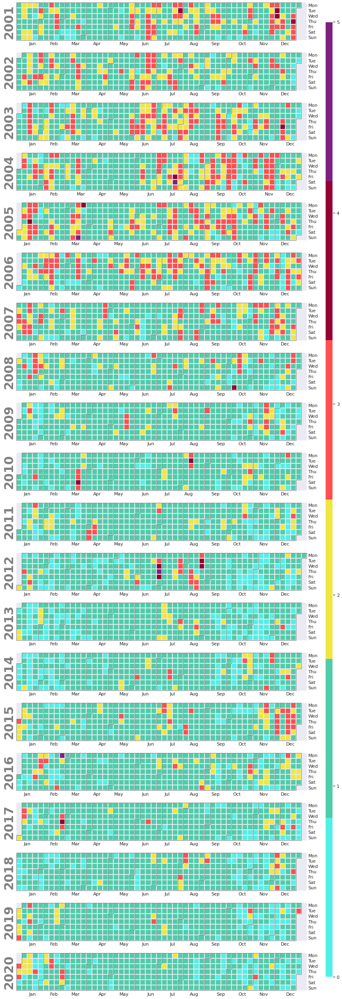

In [26]:
import calplot
import matplotlib

fig, axes = calplot.calplot(df['general_aqi'], cmap=matplotlib.colors.ListedColormap(['#50F0E6', '#50CCAA', '#F0E641', '#FF5050', '#960032', '#7D2181']))

In [29]:
fig = go.Figure()
for year in range(2001, 2021):
    year_df = air_quality_weather_avg[air_quality_weather_avg['date'].dt.year == year][['O_3', 'NO_2', 'PM25', 'PM10', 'SO_2']].mean().to_frame().reset_index()
    fig.add_trace(go.Scatterpolar(
      r=year_df[0],
      theta=year_df['index'],
      fill='toself',
      name=f'Pollutants {year} µg/m3'
    ))
    fig.update_traces(fill='toself')
fig.show()